# Кузьмин Александр ИУ5-62Б
# НИРС

Набор данных содержит медицинскую статистику и категориальную информацию о пациентах, которым был поставлен диагноз СПИД.: https://www.kaggle.com/datasets/aadarshvelu/aids-virus-infection-prediction/data

Описание признаков:

time: время до неудачи или цензурирования\
trt: показатель лечения (0 = только ZDV; 1 = ZDV + ddI, 2 = ZDV + Zal, 3 = только ddI)\
age: возраст (лет) на исходном уровне\
wtkg (кг): вес (кг) на исходном уровне\
hemo: гемофилия (0=нет, 1=да)\
homo: гомосексуальная активность (0=нет, 1=да)\
drugs: история внутривенного употребления наркотиков (0=нет, 1=да)\
karnof: оценка по шкале Карнофского (по шкале 0-100)\
oprior: Антиретровирусная терапия без ЗДВ до 175 лет (0=нет, 1=да)\
z30: ZDV в течение 30 дней до 175 (0=нет, 1=да)\
preanti: дни антиретровирусной терапии до 175 г.\
race: раса (0=белые, 1=небелые)\
gender: пол (0=Ж, 1=М)\
str2: антиретровирусный анамнез (0=наивный, 1=опытный)\
strat: стратификация антиретровирусного анамнеза (1=«наивный антиретровирус», 2=«> 1, но <= 52 недель предшествующей
антиретровирусной терапии», 3=«> 52 недель»)\
symptom: показатель симптоматики (0=asymp, 1=symp)\
treat: показатель лечения (0= только ЗДВ, 1=другие)\
offrt: показатель прекращения терапии до 96+/-5 недель (0=нет, 1=да)\
cd40: CD4 на исходном уровне\
cd420: CD4 на 20+/-5 неделе\
cd80: CD8 на исходном уровне\
cd820: CD8 в 20+/-5 недель\
инфицирован: инфицирован ли СПИДом (0=нет, 1=да)\

### Импорт библиотек
Импортируем библиотеки с помощью команды import. Как правило, все команды import размещают в первых ячейках ноутбука.

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
#from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, median_absolute_error, r2_score 
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.svm import SVC, NuSVC, LinearSVC, OneClassSVM, SVR, NuSVR, LinearSVR
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import ExtraTreesClassifier, ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
%matplotlib inline 
sns.set(style="ticks")

### Загрузка данных

Загрузим файлы датасета в помощью библиотеки Pandas. 



In [3]:
#считаем файл целиком
original_data = pd.read_csv('AIDS_Classification_50000.csv', sep=",")

In [4]:
# Удалим дубликаты записей, если они присутствуют
data = original_data.drop_duplicates()


## Проведение разведочного анализа данных. Построение графиков, необходимых для понимания структуры данных. Анализ и заполнение пропусков в данных.

### Основные характеристики датасетов

In [5]:
# Первые 5 строк датасета
data.head()

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820,infected
0,1073,1,37,79.46339,0,1,0,100,0,1,...,1,2,0,1,0,322,469,882,754,1
1,324,0,33,73.02314,0,1,0,90,0,1,...,1,3,1,1,1,168,575,1035,1525,1
2,495,1,43,69.47793,0,1,0,100,0,1,...,1,1,0,0,0,377,333,1147,1088,1
3,1201,3,42,89.15934,0,1,0,100,1,1,...,1,3,0,0,0,238,324,775,1019,1
4,934,0,37,137.46581,0,1,0,100,0,0,...,0,3,0,0,1,500,443,1601,849,0


In [6]:
# Размер датасета - 53732 строки, 9 колонок
data.shape

(50000, 23)

In [7]:
# Список колонок
data.columns

Index(['time', 'trt', 'age', 'wtkg', 'hemo', 'homo', 'drugs', 'karnof',
       'oprior', 'z30', 'preanti', 'race', 'gender', 'str2', 'strat',
       'symptom', 'treat', 'offtrt', 'cd40', 'cd420', 'cd80', 'cd820',
       'infected'],
      dtype='object')

In [8]:
# Список колонок с типами данных 
# убедимся что типы данных одинаковы в обучающей и тестовых выборках
data.dtypes

time          int64
trt           int64
age           int64
wtkg        float64
hemo          int64
homo          int64
drugs         int64
karnof        int64
oprior        int64
z30           int64
preanti       int64
race          int64
gender        int64
str2          int64
strat         int64
symptom       int64
treat         int64
offtrt        int64
cd40          int64
cd420         int64
cd80          int64
cd820         int64
infected      int64
dtype: object

In [9]:
# Проверим наличие пустых значений
data.isnull().sum()

time        0
trt         0
age         0
wtkg        0
hemo        0
homo        0
drugs       0
karnof      0
oprior      0
z30         0
preanti     0
race        0
gender      0
str2        0
strat       0
symptom     0
treat       0
offtrt      0
cd40        0
cd420       0
cd80        0
cd820       0
infected    0
dtype: int64

**Вывод. Представленный набор данных не содержит пропусков ни в обучающей, ни в тестовой выборках.**

### Построение графиков для понимания структуры данных

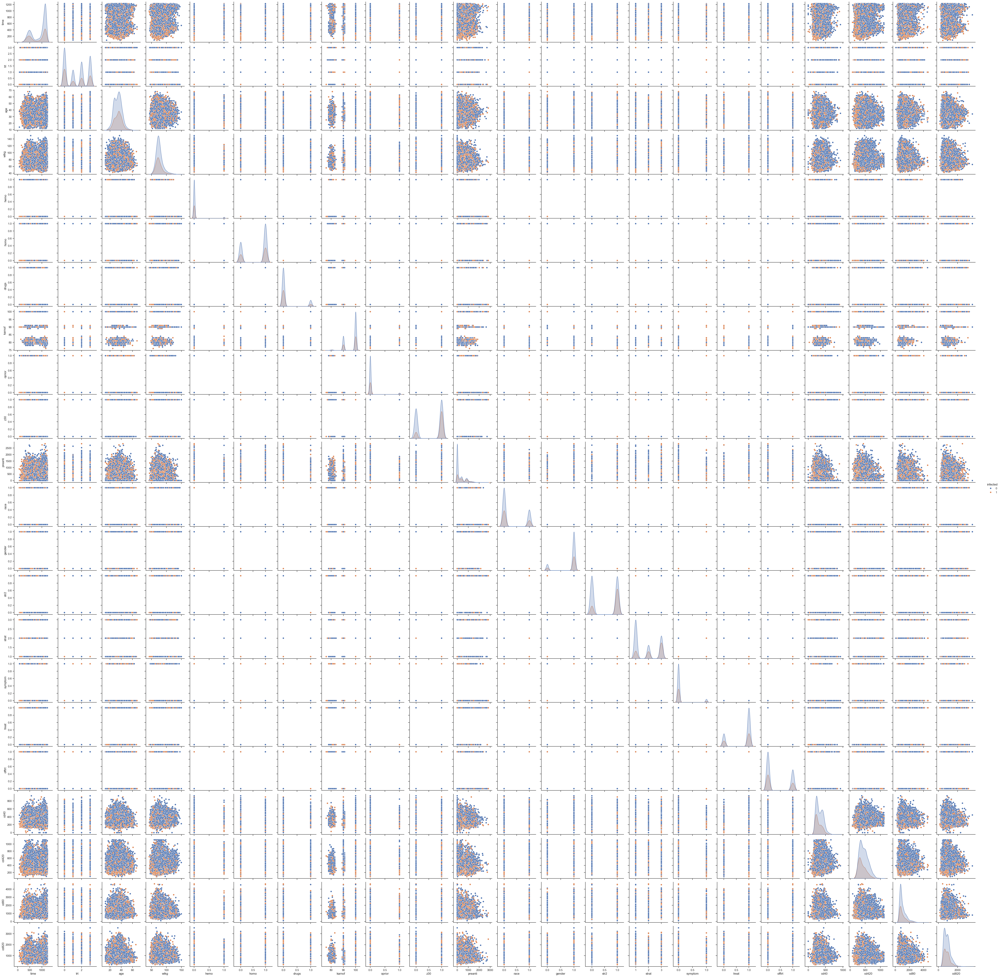

In [10]:
sns.pairplot(data, hue="infected")

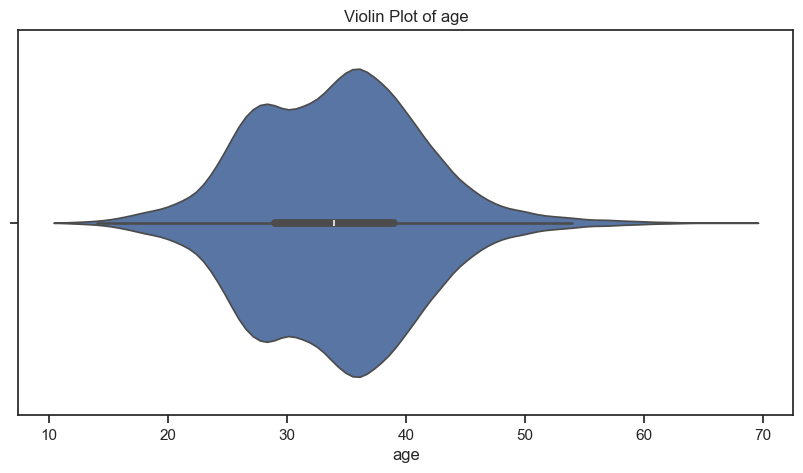

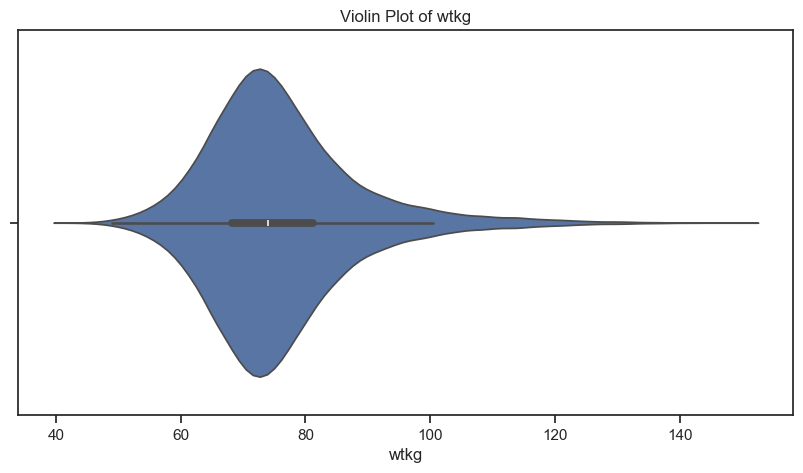

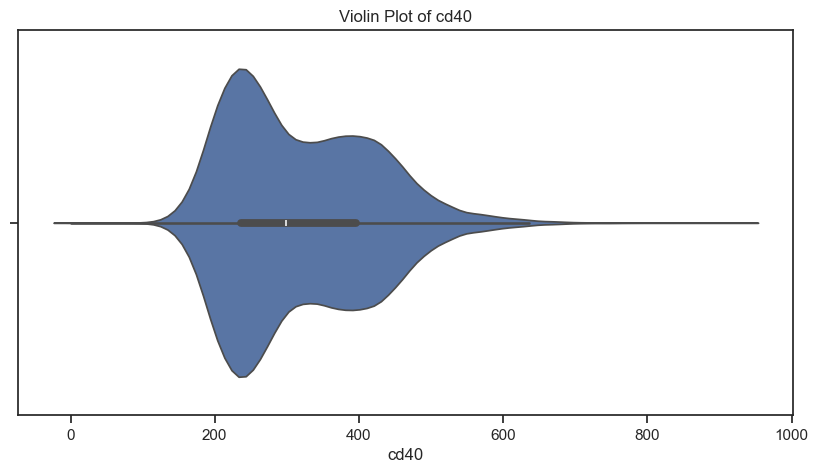

In [45]:
for col in ['age', 'wtkg', 'cd40']:
    fig, ax = plt.subplots(figsize=(10, 5))  # Create a single subplot
    sns.violinplot(ax=ax, x=data[col])       # Use the single subplot
    plt.title(f'Violin Plot of {col}')       # Optionally add a title
    plt.show()   

In [16]:
# Убедимся, что целевой признак
# для задачи бинарной классификации содержит только 0 и 1
data['infected'].unique()

array([1, 0], dtype=int64)

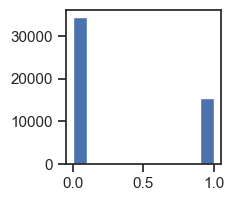

In [17]:
# Оценим дисбаланс классов 
fig, ax = plt.subplots(figsize=(2,2)) 
plt.hist(data['infected'])
plt.show()

In [18]:
data['infected'].value_counts()

infected
0    34494
1    15506
Name: count, dtype: int64

In [19]:
# посчитаем дисбаланс классов
total = data.shape[0]
class_0, class_1 = data['infected'].value_counts()
print('Класс 0 составляет {}%, а класс 1 составляет {}%.'
      .format(round(class_0 / total, 4)*100, round(class_1 / total, 4)*100))

Класс 0 составляет 68.99%, а класс 1 составляет 31.009999999999998%.


In [46]:
# Количество образцов, которые нужно оставить из класса 0
class_0_samples = data[data['infected'] == 0]
class_1_samples = data[data['infected'] == 1]
retain_class_0 = len(class_0_samples) // 2

# Случайный выбор образцов из класса 0
class_0_reduced = class_0_samples.sample(n=retain_class_0, random_state=42)

# Объединение уменьшенного класса 0 с классом 1
balanced_data = pd.concat([class_0_reduced, class_1_samples])

# Опционально: перемешивание итогового набора данных
balanced_data = balanced_data.sample(frac=1, random_state=42).reset_index(drop=True)

# Проверка нового распределения классов
total_new = balanced_data.shape[0]
new_class_0, new_class_1 = balanced_data['infected'].value_counts()
print('После балансировки класс 0 составляет {}%, а класс 1 составляет {}%.'
      .format(round(new_class_0 / total_new, 4) * 100, round(new_class_1 / total_new, 4) * 100))

После балансировки класс 0 составляет 52.66%, а класс 1 составляет 47.339999999999996%.


**Вывод. Дисбаланс классов присутствует, но не значительный**

## Выбор признаков, подходящих для построения моделей.Масштабирование данных. 

In [47]:
balanced_data.dtypes

time          int64
trt           int64
age           int64
wtkg        float64
hemo          int64
homo          int64
drugs         int64
karnof        int64
oprior        int64
z30           int64
preanti       int64
race          int64
gender        int64
str2          int64
strat         int64
symptom       int64
treat         int64
offtrt        int64
cd40          int64
cd420         int64
cd80          int64
cd820         int64
infected      int64
dtype: object

Для построения моделей будем использовать все признаки.

Категориальные признаки отсутствуют, их кодирования не требуется. 

Вспомогательные признаки для улучшения качества моделей в данном примере мы строить не будем.

Выполним масштабирование данных.

In [48]:
balanced_data.describe()

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820,infected
count,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,...,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000
mean,865.117180,1.360425,34.257656,75.593360,0.034470,0.651421,0.127744,96.800721,0.044912,0.680854,...,0.618081,2.017098,0.085916,0.723873,0.337404,314.300217,429.355479,1042.354013,903.206638,0.473422
std,311.958378,1.237421,7.070465,12.025158,0.182436,0.476528,0.333810,5.120555,0.207114,0.466153,...,0.485864,0.892699,0.280244,0.447087,0.472831,101.786056,143.744245,484.978488,338.881033,0.499301
min,66.000000,0.000000,12.000000,42.361620,0.000000,0.000000,0.000000,76.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,81.000000,96.000000,173.000000,0.000000
25%,529.000000,0.000000,29.000000,67.968310,0.000000,0.000000,0.000000,90.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,233.000000,320.000000,711.000000,648.000000,0.000000
50%,1034.000000,1.000000,34.000000,73.799770,0.000000,1.000000,0.000000,100.000000,0.000000,1.000000,...,1.000000,2.000000,0.000000,1.000000,0.000000,292.000000,405.000000,884.000000,854.000000,0.000000
75%,1134.000000,3.000000,39.000000,80.924040,0.000000,1.000000,0.000000,100.000000,0.000000,1.000000,...,1.000000,3.000000,0.000000,1.000000,1.000000,390.000000,521.000000,1242.000000,1079.000000,1.000000
max,1231.000000,3.000000,68.000000,145.202970,1.000000,1.000000,1.000000,100.000000,1.000000,1.000000,...,1.000000,3.000000,1.000000,1.000000,1.000000,901.000000,1119.000000,4656.000000,3214.000000,1.000000


Из всех данных требуется масштабировать колонки:

In [49]:
columns_to_scale = ['time', 'age', 'wtkg', 'karnof', 'preanti', 'cd40', 'cd420', 'cd80', 'cd820']

scaler = MinMaxScaler()
data2 = pd.DataFrame(balanced_data, columns=data.columns)
# Масштабирование колонок
data2[columns_to_scale] = scaler.fit_transform(balanced_data[columns_to_scale])

data2.describe()

,time,trt,age,wtkg,hemo,homo,drugs,karnof,oprior,z30,...,str2,strat,symptom,treat,offtrt,cd40,cd420,cd80,cd820,infected
count,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,...,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000,32753.000000
mean,0.685937,1.360425,0.397458,0.323136,0.034470,0.651421,0.127744,0.866697,0.044912,0.680854,...,0.618081,2.017098,0.085916,0.723873,0.337404,0.348835,0.335603,0.207534,0.240121,0.473422
std,0.267775,1.237421,0.126258,0.116929,0.182436,0.476528,0.333810,0.213356,0.207114,0.466153,...,0.485864,0.892699,0.280244,0.447087,0.472831,0.112970,0.138482,0.106355,0.111437,0.499301
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.397425,0.000000,0.303571,0.248992,0.000000,0.000000,0.000000,0.583333,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.258602,0.230250,0.134868,0.156199,0.000000
50%,0.830901,1.000000,0.392857,0.305696,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,...,1.000000,2.000000,0.000000,1.000000,0.000000,0.324084,0.312139,0.172807,0.223939,0.000000
75%,0.916738,3.000000,0.482143,0.374970,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,...,1.000000,3.000000,0.000000,1.000000,1.000000,0.432852,0.423892,0.251316,0.297928,1.000000
max,1.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


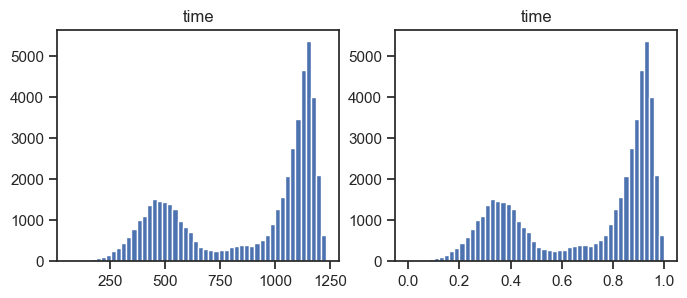

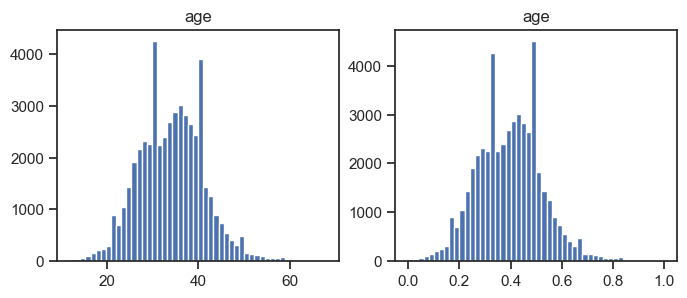

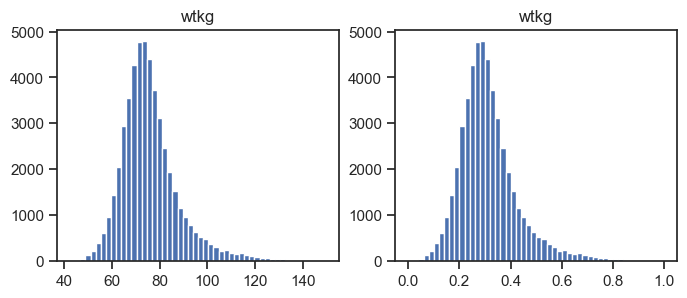

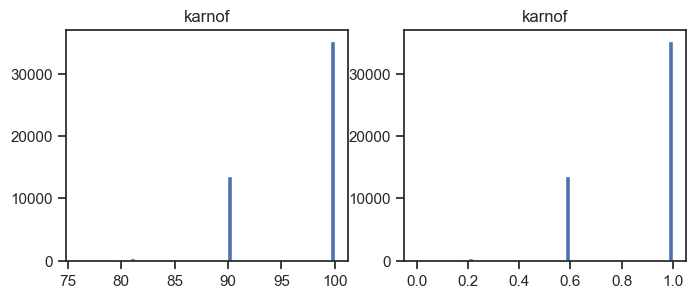

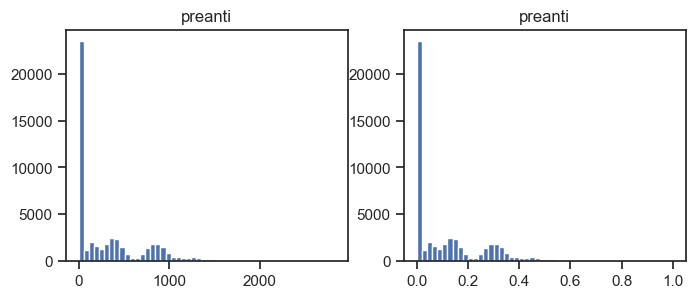

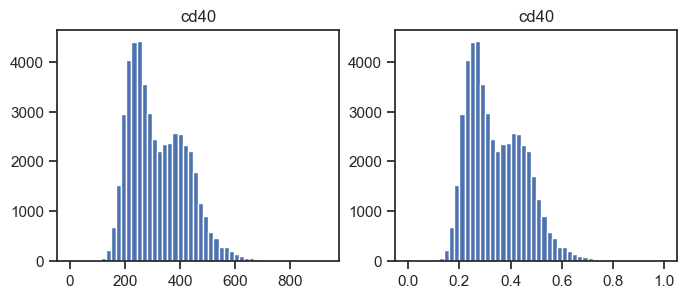

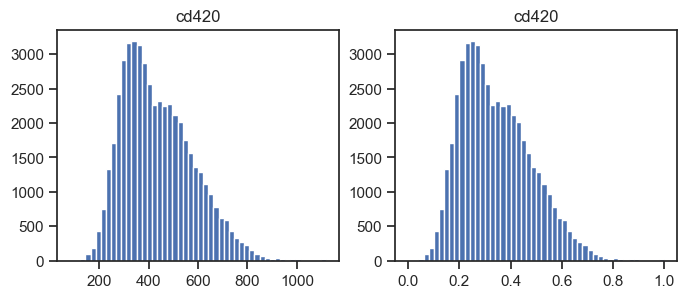

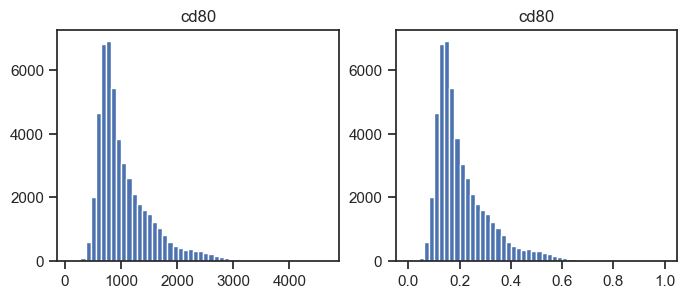

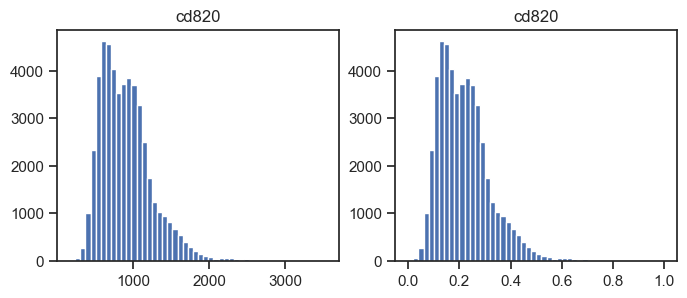

In [23]:
# Проверим, что масштабирование не повлияло на распределение данных
for col in columns_to_scale:
    fig, ax = plt.subplots(1, 2, figsize=(8,3))
    ax[0].hist(data[col], 50)
    ax[1].hist(data2[col], 50)
    ax[0].title.set_text(col)
    ax[1].title.set_text(col)
    plt.show()

In [51]:
# Посчитаем корреляцию Пирсона между признаками и целевым параметром
correlation = data2.corr()['infected'].abs()

# Выберем порог корреляции (например, 0.1)
threshold = 0.05

# Отберем признаки, корреляция которых с целевым параметром превышает порог
selected_features = correlation[correlation > threshold].index.tolist()

# Создадим новый DataFrame только с выбранными признаками
data3 = data2[selected_features]
data3.shape

(32753, 10)

## Проведение корреляционного анализа данных. Формирование промежуточных выводов о возможности построения моделей машинного обучения. 

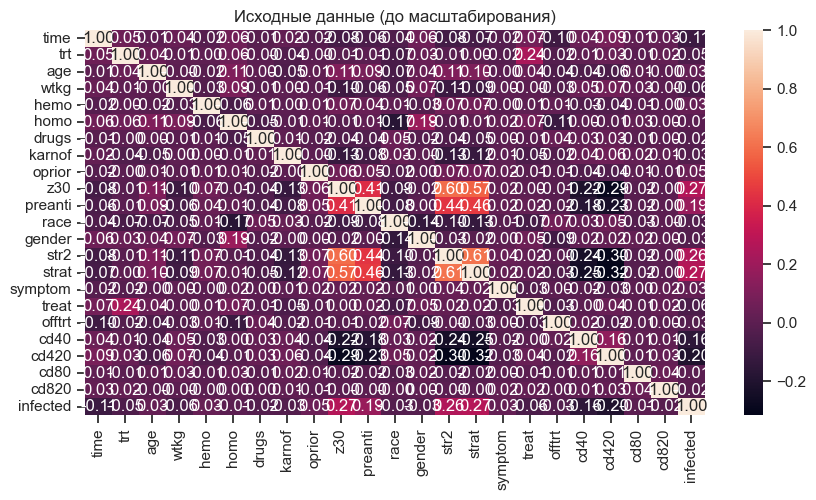

In [55]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(balanced_data.corr(), annot=True, fmt='.2f')
ax.set_title('Исходные данные (до масштабирования)')
plt.show()

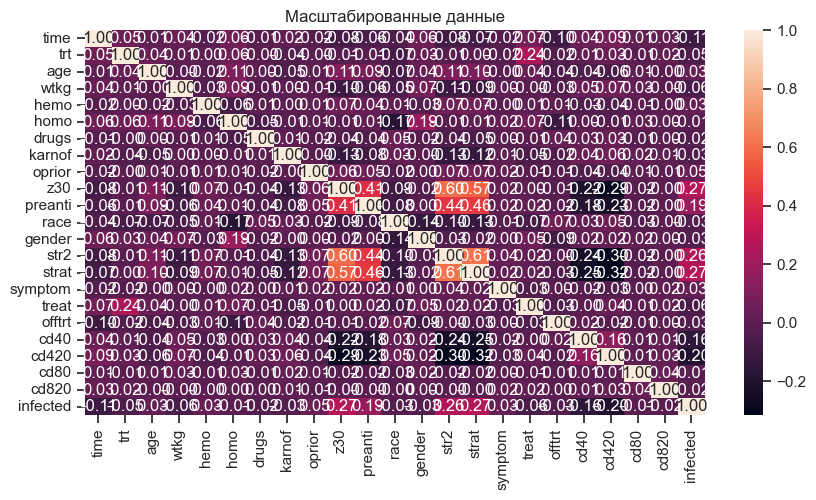

In [53]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(data2.corr(), annot=True, fmt='.2f')
ax.set_title('Масштабированные данные')
plt.show()

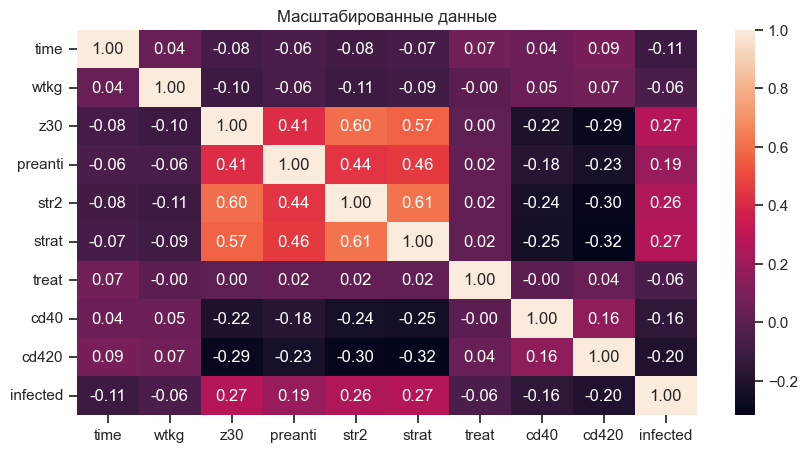

In [54]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(data3.corr(), annot=True, fmt='.2f')
ax.set_title('Масштабированные данные')
plt.show()

## Выбор метрик для последующей оценки качества моделей. 

### В качестве метрик для решения задачи классификации  будем использовать:

Метрики, формируемые на основе матрицы ошибок:

#### Метрика precision:

Можно переводить как точность, но такой перевод совпадает с переводом метрики "accuracy".

$precision = \frac{TP}{TP+FP}$

Доля верно предсказанных классификатором положительных объектов, из всех объектов, которые классификатор верно или неверно определил как положительные.

Используется функция [precision_score.](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_score.html#sklearn.metrics.precision_score)

#### Метрика recall (полнота):

$recall = \frac{TP}{TP+FN}$

Доля верно предсказанных классификатором положительных объектов, из всех действительно положительных объектов.

Используется функция [recall_score.](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.recall_score.html#sklearn.metrics.recall_score)

#### Метрика $F_1$-мера

Для того, чтобы объединить precision и recall в единую метрику используется $F_\beta$-мера, которая вычисляется как среднее гармоническое от precision и recall:

$F_\beta = (1+\beta^2) \cdot \frac{precision \cdot recall}{precision + recall}$

где $\beta$ определяет вес точности в метрике.

На практике чаще всего используют вариант F1-меры (которую часто называют F-мерой) при $\beta=1$:

$F_1 = 2 \cdot \frac{precision \cdot recall}{precision + recall}$

Для вычисления используется функция [f1_score.](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html#sklearn.metrics.f1_score)

#### Метрика ROC AUC

Основана на вычислении следующих характеристик:

$TPR = \frac{TP}{TP+FN}$ - True Positive Rate, откладывается по оси ординат. Совпадает с recall.

$FPR = \frac{FP}{FP+TN}$ - False Positive Rate, откладывается по оси абсцисс. Показывает какую долю из объектов отрицательного класса алгоритм предсказал неверно.

Идеальная ROC-кривая проходит через точки (0,0)-(0,1)-(1,1), то есть через верхний левый угол графика.

Чем сильнее отклоняется кривая от верхнего левого угла графика, тем хуже качество классификации.

В качестве количественной метрики используется площадь под кривой - ROC AUC (Area Under the Receiver Operating Characteristic Curve). Чем ниже проходит кривая тем меньше ее площадь и тем хуже качество классификатора.

Для получения ROC AUC используется функция [roc_auc_score.](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html#sklearn.metrics.roc_auc_score)

### Сохранение и визуализация метрик

Разработаем класс, который позволит сохранять метрики качества построенных моделей и реализует визуализацию метрик качества.

In [57]:
class MetricLogger:
    def __init__(self):
        self.df = pd.DataFrame({
            'metric': pd.Series([], dtype='str'),
            'alg': pd.Series([], dtype='str'),
            'value': pd.Series([], dtype='float')
        })

    def add(self, metric, alg, value):
        """
        Добавление значения
        """
        # Удаление значения если оно уже было ранее добавлено
        self.df.drop(self.df[(self.df['metric'] == metric) & (self.df['alg'] == alg)].index, inplace=True)
        # Добавление нового значения
        temp = pd.DataFrame([{'metric': metric, 'alg': alg, 'value': value}])
        self.df = pd.concat([self.df, temp], ignore_index=True)

    def get_data_for_metric(self, metric, ascending=True):
        """
        Формирование данных с фильтром по метрике
        """
        temp_data = self.df[self.df['metric'] == metric]
        temp_data_2 = temp_data.sort_values(by='value', ascending=ascending)
        return temp_data_2['alg'].values, temp_data_2['value'].values

    def plot(self, str_header, metric, ascending=True, figsize=(5, 5)):
        """
        Вывод графика
        """
        array_labels, array_metric = self.get_data_for_metric(metric, ascending)
        fig, ax1 = plt.subplots(figsize=figsize)
        pos = np.arange(len(array_metric))
        rects = ax1.barh(pos, array_metric,
                         align='center',
                         height=0.5, 
                         tick_label=array_labels)
        ax1.set_title(str_header)
        for a, b in zip(pos, array_metric):
            plt.text(0.5, a - 0.05, str(round(b, 3)), color='white')
        plt.show()

## Выбор наиболее подходящих моделей для решения задачи классификации или регрессии.

Для задачи классификации будем использовать следующие модели:
- Логистическая регрессия
- Метод ближайших соседей
- Машина опорных векторов
- Решающее дерево
- Случайный лес
- Градиентный бустинг


## Формирование обучающей и тестовой выборок на основе исходного набора данных.

In [58]:
data_X_train, data_X_test, data_y_train, data_y_test = train_test_split(data3.drop('infected', axis=1), data3['infected'], test_size=0.3,random_state=42)

In [59]:
data_X_train.shape, data_X_test.shape, data_y_train.shape, data_y_test.shape

((22927, 9), (9826, 9), (22927,), (9826,))

## Построение базового решения (baseline) для выбранных моделей без подбора гиперпараметров. Производится обучение моделей на основе обучающей выборки и оценка качества моделей на основе тестовой выборки.

### Решение задачи классификации

In [60]:
# Модели
clas_models = {'LogR': LogisticRegression(), 
               'KNN_5':KNeighborsClassifier(n_neighbors=5),
               'SVC':SVC(probability=True),
               'Tree':DecisionTreeClassifier(),
               'RF':RandomForestClassifier(),
               'GB':GradientBoostingClassifier()}

In [32]:
# Сохранение метрик
clasMetricLogger = MetricLogger()

In [33]:
# Отрисовка ROC-кривой
def draw_roc_curve(y_true, y_score, ax, pos_label=1, average='micro'):
    fpr, tpr, thresholds = roc_curve(y_true, y_score, 
                                     pos_label=pos_label)
    roc_auc_value = roc_auc_score(y_true, y_score, average=average)
    #plt.figure()
    lw = 2
    ax.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_value)
    ax.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_xlim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic')
    ax.legend(loc="lower right")

In [34]:
def clas_train_model(model_name, model, dataMetricLogger):
    model.fit(data_X_train, data_y_train)
    # Предсказание значений
    Y_pred = model.predict(data_X_test)
    # Предсказание вероятности класса "1" для roc auc
    Y_pred_proba_temp = model.predict_proba(data_X_test)
    Y_pred_proba = Y_pred_proba_temp[:,1]
    
    precision = precision_score(data_y_test.values, Y_pred)
    recall = recall_score(data_y_test.values, Y_pred)
    f1 = f1_score(data_y_test.values, Y_pred)
    roc_auc = roc_auc_score(data_y_test.values, Y_pred_proba)
    
    clasMetricLogger.add('precision', model_name, precision)
    clasMetricLogger.add('recall', model_name, recall)
    clasMetricLogger.add('f1', model_name, f1)
    clasMetricLogger.add('roc_auc', model_name, roc_auc)

    fig, ax = plt.subplots(ncols=2, figsize=(10, 5))
    draw_roc_curve(data_y_test, Y_pred_proba, ax[0])
    ConfusionMatrixDisplay.from_estimator(model, data_X_test, data_y_test, ax=ax[1],
                                          display_labels=['0', '1'],
                                          cmap=plt.cm.Blues, normalize='true')
    fig.suptitle(model_name)
    plt.show()

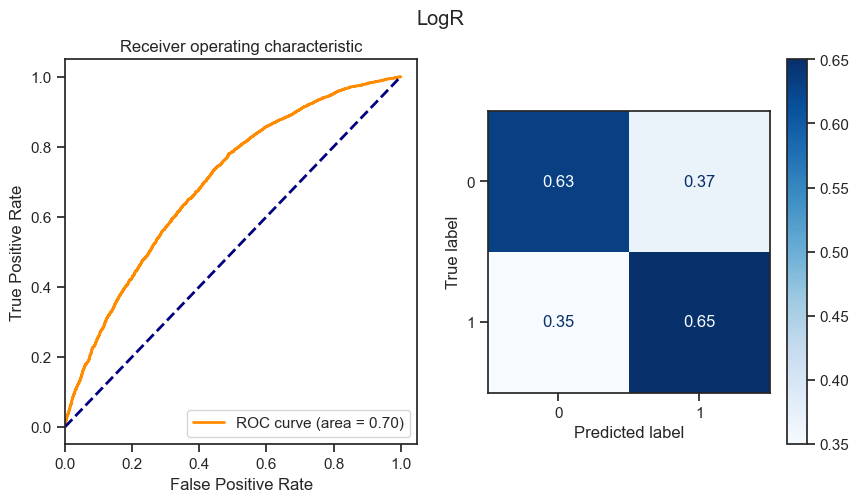

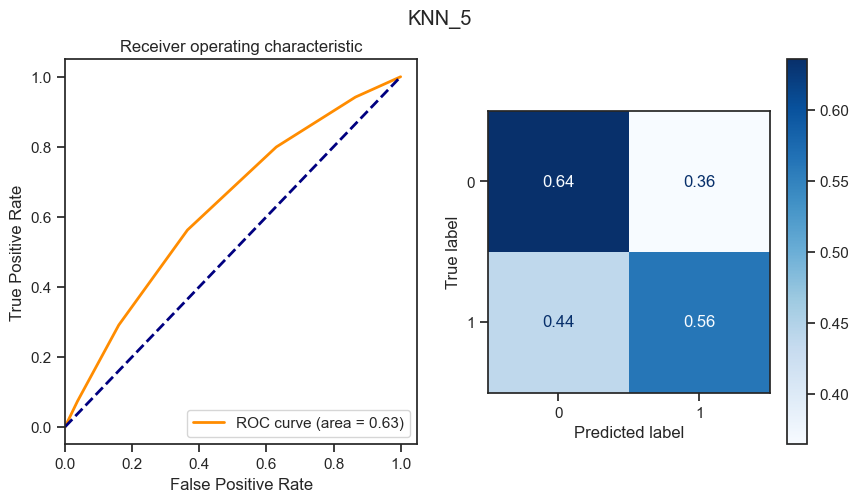

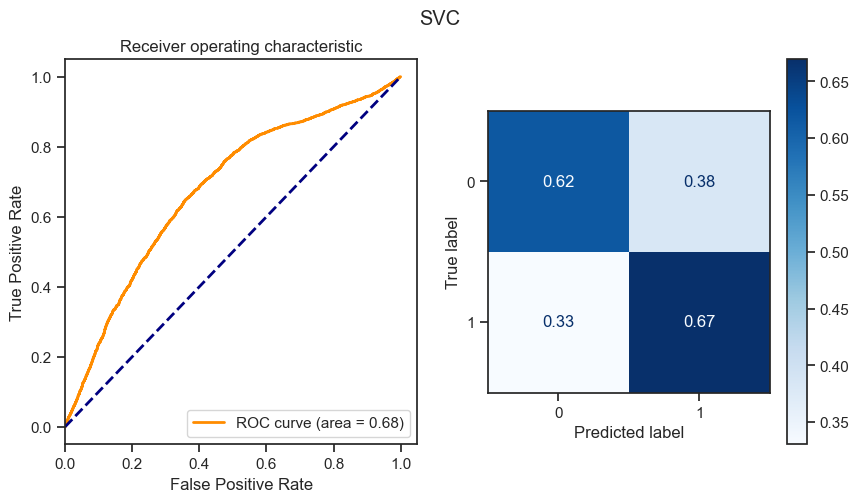

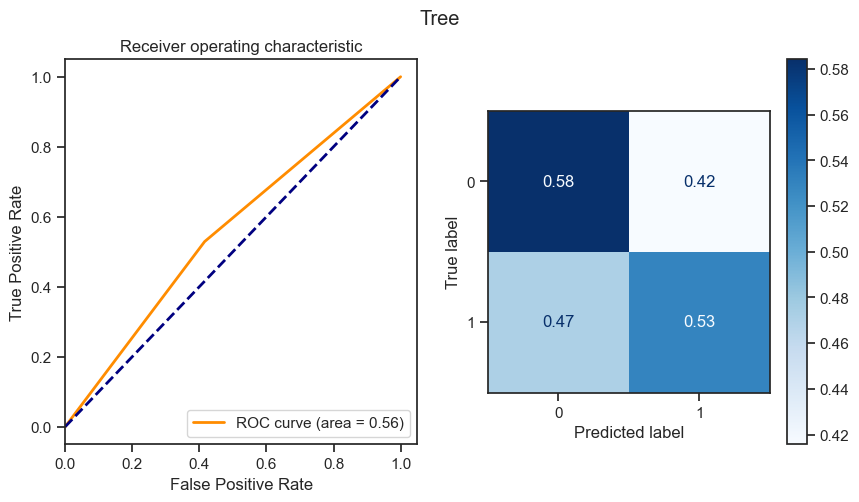

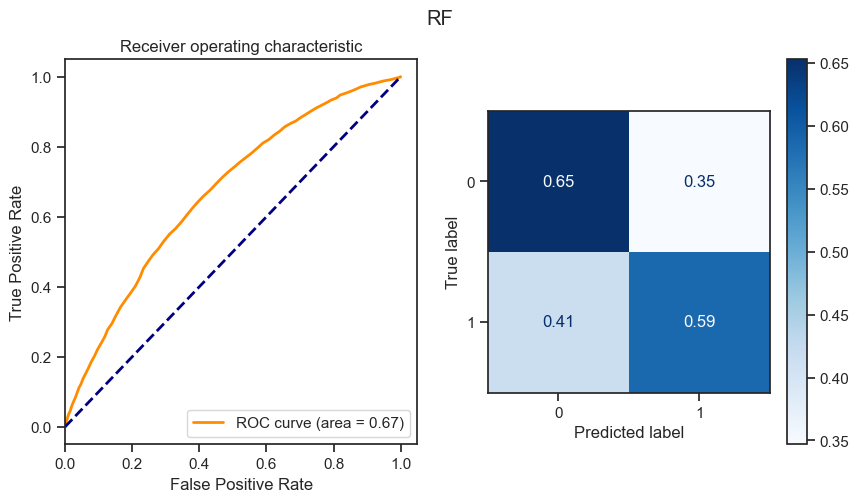

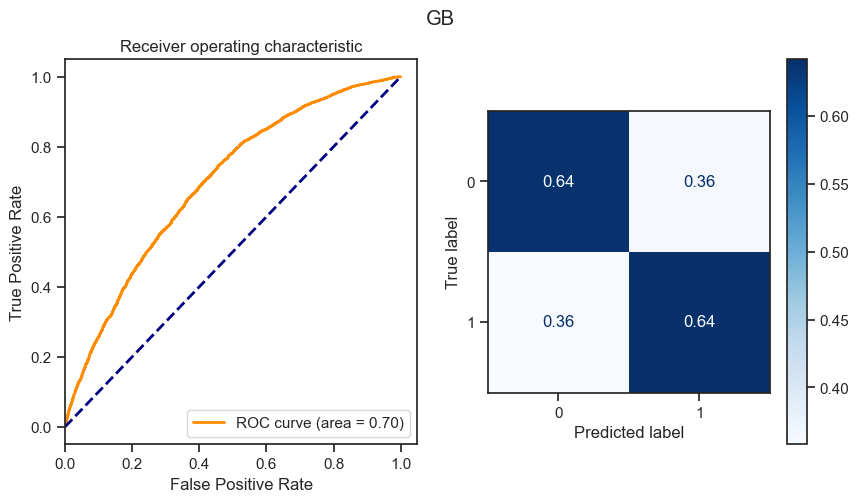

In [61]:
for model_name, model in clas_models.items():
    clas_train_model(model_name, model, clasMetricLogger)

## Подбор гиперпараметров для выбранных моделей. Рекомендуется использовать методы кросс-валидации. В зависимости от используемой библиотеки можно применять функцию GridSearchCV, использовать перебор параметров в цикле, или использовать другие методы.

In [62]:
data_X_train.shape

(22927, 9)

In [63]:
n_range_list = list(range(0,1250,50))
n_range_list[0] = 1

In [64]:
n_range = np.array(n_range_list)
tuned_parameters = [{'n_neighbors': n_range}]
tuned_parameters

[{'n_neighbors': array([   1,   50,  100,  150,  200,  250,  300,  350,  400,  450,  500,
          550,  600,  650,  700,  750,  800,  850,  900,  950, 1000, 1050,
         1100, 1150, 1200])}]

In [65]:
%%time
clf_gs = GridSearchCV(KNeighborsClassifier(), tuned_parameters, cv=5, scoring='roc_auc')
clf_gs.fit(data_X_train, data_y_train)

CPU times: total: 2min 5s
Wall time: 2min 17s


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid=[{'n_neighbors': array([   1,   50,  100,  150,  200,  250,  300,  350,  400,  450,  500,
        550,  600,  650,  700,  750,  800,  850,  900,  950, 1000, 1050,
       1100, 1150, 1200])}],
             scoring='roc_auc')

In [66]:
# Лучшая модель
clf_gs.best_estimator_

KNeighborsClassifier(n_neighbors=150)

In [67]:
# Лучшее значение параметров
clf_gs.best_params_

{'n_neighbors': 150}

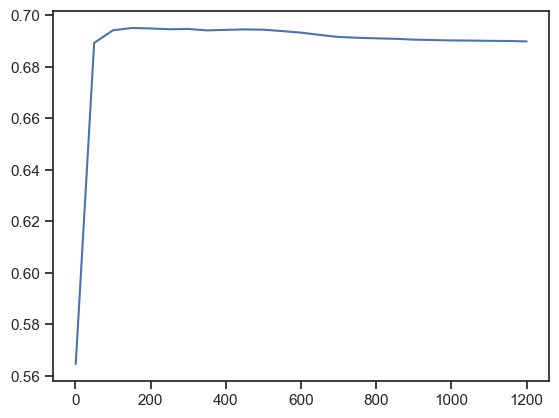

In [69]:
# Изменение качества на тестовой выборке в зависимости от К-соседей
plt.plot(n_range, clf_gs.cv_results_['mean_test_score'])

In [74]:
# Random Forest
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

rf_gs = GridSearchCV(RandomForestClassifier(), rf_param_grid, cv=5, scoring='roc_auc')
rf_gs.fit(data_X_train, data_y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='roc_auc')

In [75]:
rf_gs.best_params_

{'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 200}

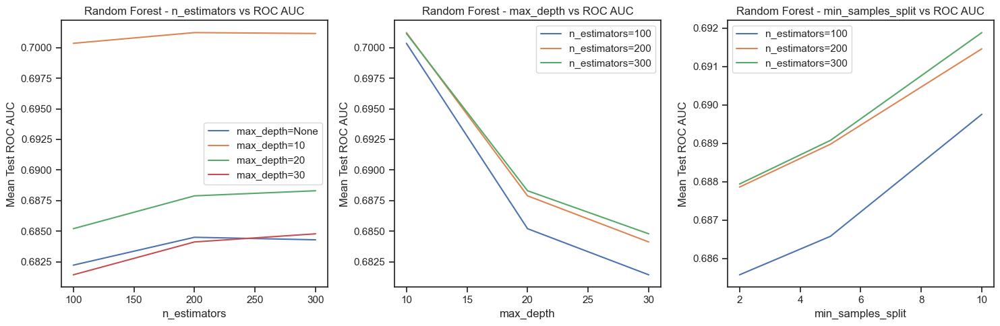

In [76]:
plt.figure(figsize=(15, 5))

# График для n_estimators
plt.subplot(1, 3, 1)
for max_depth in rf_param_grid['max_depth']:
    mean_test_scores = []
    for n_estimators in rf_param_grid['n_estimators']:
        mean_test_score = np.mean([score for params, score in zip(rf_gs.cv_results_['params'], rf_gs.cv_results_['mean_test_score']) 
                                   if params['max_depth'] == max_depth and params['n_estimators'] == n_estimators])
        mean_test_scores.append(mean_test_score)
    plt.plot(rf_param_grid['n_estimators'], mean_test_scores, label=f'max_depth={max_depth}')
plt.xlabel('n_estimators')
plt.ylabel('Mean Test ROC AUC')
plt.title('Random Forest - n_estimators vs ROC AUC')
plt.legend()

# График для max_depth
plt.subplot(1, 3, 2)
for n_estimators in rf_param_grid['n_estimators']:
    mean_test_scores = []
    for max_depth in rf_param_grid['max_depth']:
        mean_test_score = np.mean([score for params, score in zip(rf_gs.cv_results_['params'], rf_gs.cv_results_['mean_test_score']) 
                                   if params['n_estimators'] == n_estimators and params['max_depth'] == max_depth])
        mean_test_scores.append(mean_test_score)
    plt.plot(rf_param_grid['max_depth'], mean_test_scores, label=f'n_estimators={n_estimators}')
plt.xlabel('max_depth')
plt.ylabel('Mean Test ROC AUC')
plt.title('Random Forest - max_depth vs ROC AUC')
plt.legend()

# График для min_samples_split
plt.subplot(1, 3, 3)
for n_estimators in rf_param_grid['n_estimators']:
    mean_test_scores = []
    for min_samples_split in rf_param_grid['min_samples_split']:
        mean_test_score = np.mean([score for params, score in zip(rf_gs.cv_results_['params'], rf_gs.cv_results_['mean_test_score']) 
                                   if params['n_estimators'] == n_estimators and params['min_samples_split'] == min_samples_split])
        mean_test_scores.append(mean_test_score)
    plt.plot(rf_param_grid['min_samples_split'], mean_test_scores, label=f'n_estimators={n_estimators}')
plt.xlabel('min_samples_split')
plt.ylabel('Mean Test ROC AUC')
plt.title('Random Forest - min_samples_split vs ROC AUC')
plt.legend()

plt.tight_layout()
plt.show()

## Повторение пункта 8 для найденных оптимальных значений гиперпараметров. Сравнение качества полученных моделей с качеством baseline-моделей.

### Решение задачи классификации

In [78]:
clas_models_grid = {
    'KNN_5': KNeighborsClassifier(n_neighbors=5),
    str('KNN_' + clf_gs_best_params_txt): clf_gs.best_estimator_,
    'RF': RandomForestClassifier(),
    str('RF_best'): rf_gs.best_estimator_,
}

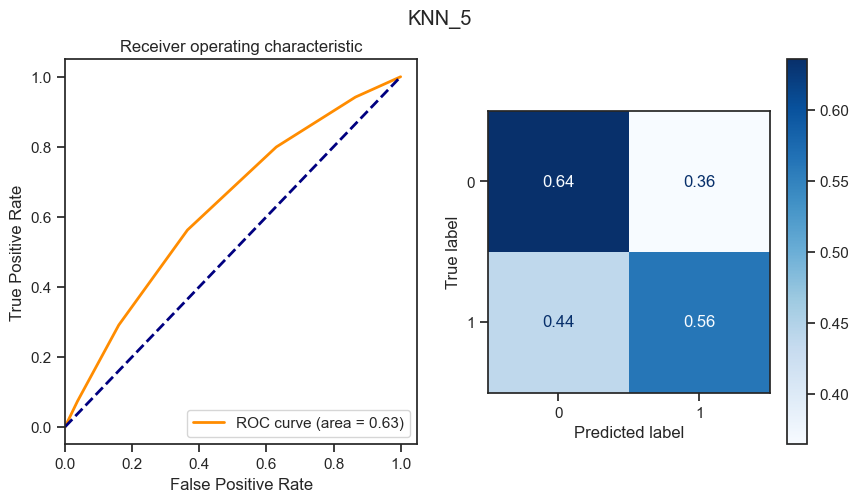

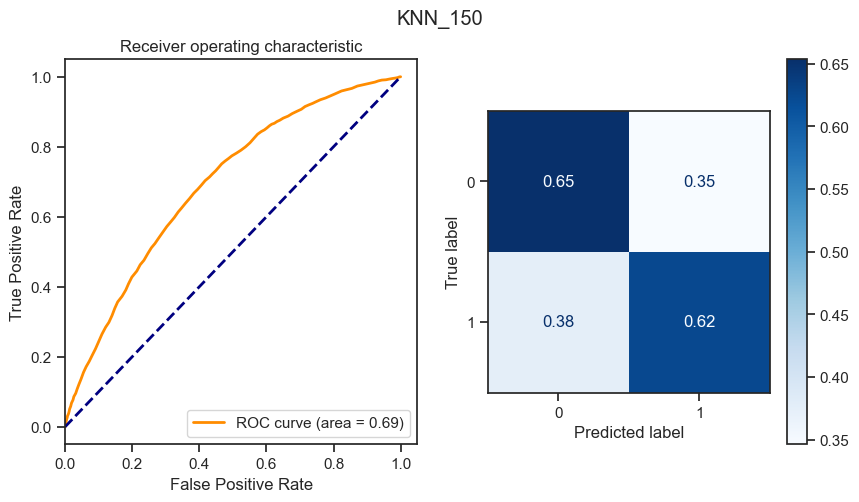

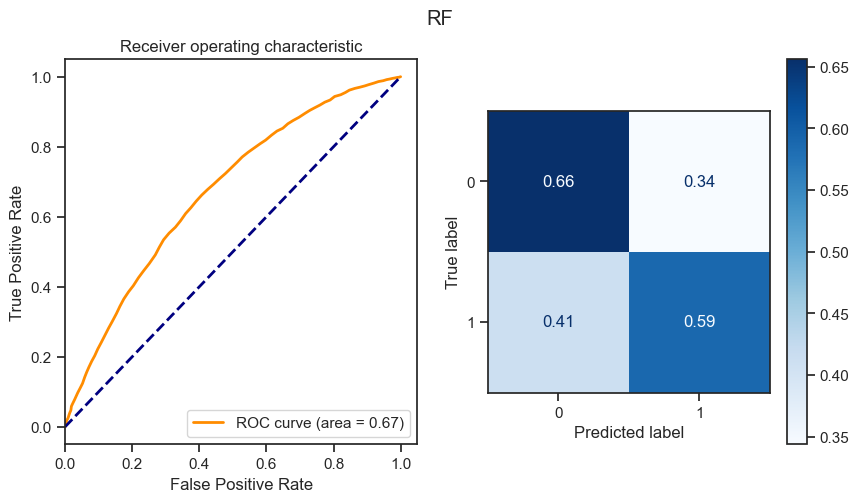

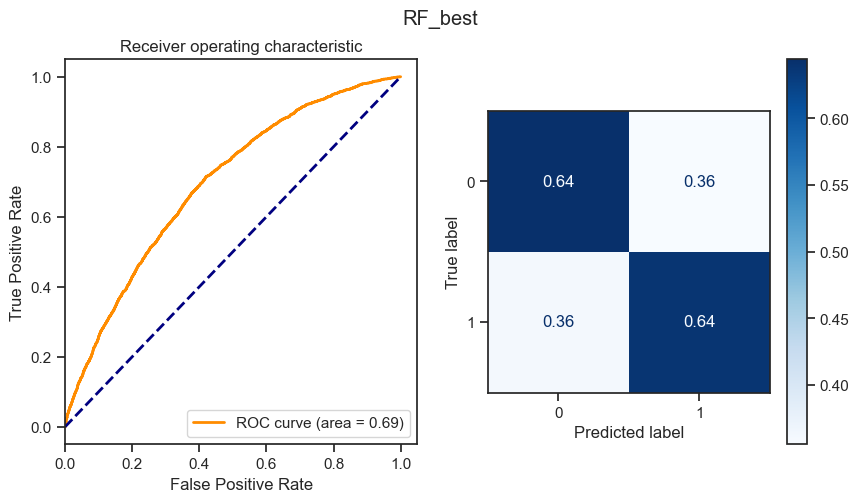

In [79]:
for model_name, model in clas_models_grid.items():
    clas_train_model(model_name, model, clasMetricLogger)

## Формирование выводов о качестве построенных моделей на основе выбранных метрик. Результаты сравнения качества рекомендуется отобразить в виде графиков и сделать выводы в форме текстового описания. Рекомендуется построение графиков обучения и валидации, влияния значений гиперпарметров на качество моделей и т.д.

### Решение задачи классификации

In [80]:
# Метрики качества модели
clas_metrics = clasMetricLogger.df['metric'].unique()
clas_metrics

array(['precision', 'recall', 'f1', 'roc_auc'], dtype=object)

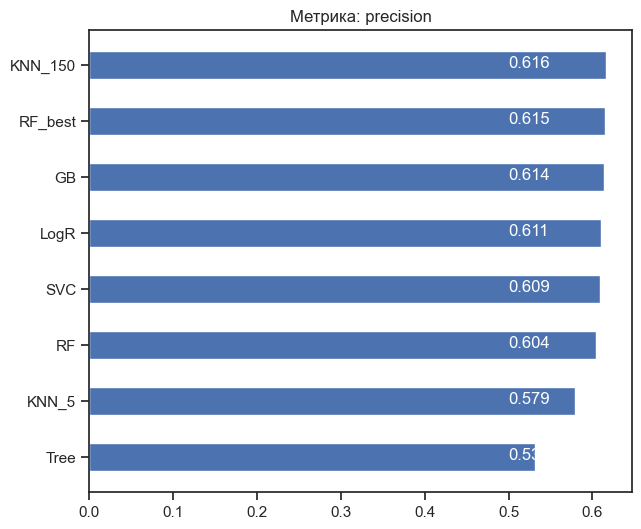

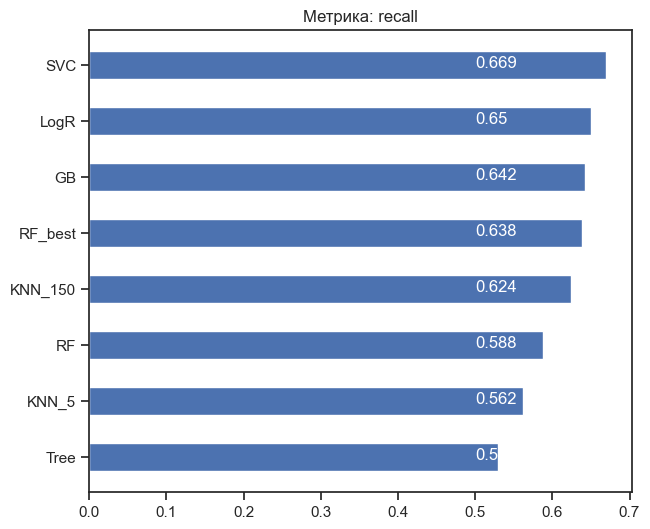

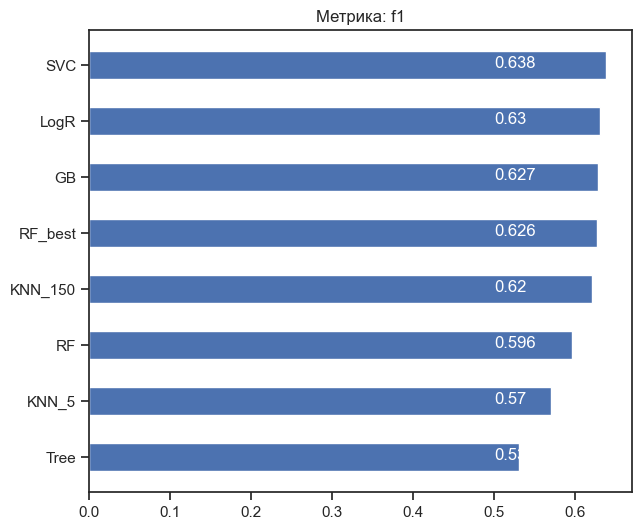

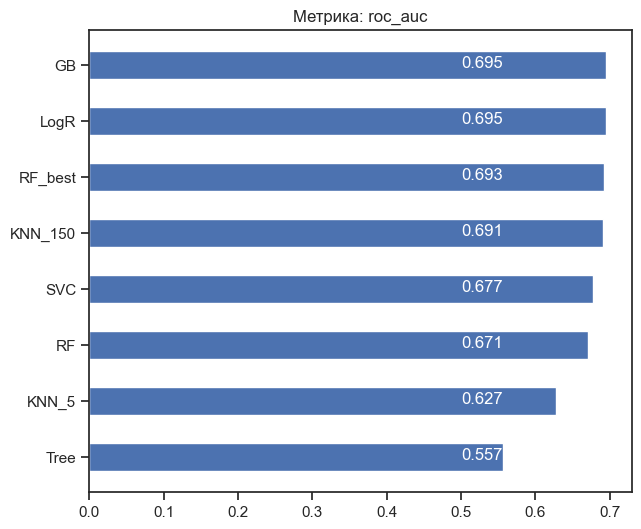

In [81]:
# Построим графики метрик качества модели
for metric in clas_metrics:
    clasMetricLogger.plot('Метрика: ' + metric, metric, figsize=(7, 6))

Полученный результат можно объяснить тем, что данные с маленькой корреляцией, а также большой размерностью данных